## Plotting embeddings

In [1]:
import chromadb

# Initialize client and load collection
client = chromadb.PersistentClient(path="icd_chroma_db")
collection = client.get_collection(name="icd_chroma_db")

# Retrieve all embeddings and metadata
results = collection.get(include=["embeddings"])
print(results)

embeddings = results['embeddings']

{'ids': ['0', '1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11', '12', '13', '14', '15', '16', '17', '18', '19', '20', '21', '22', '23', '24', '25', '26', '27', '28', '29', '30', '31', '32', '33', '34', '35', '36', '37', '38', '39', '40', '41', '42', '43', '44', '45', '46', '47', '48', '49', '50', '51', '52', '53', '54', '55', '56', '57', '58', '59', '60', '61', '62', '63', '64', '65', '66', '67', '68', '69', '70', '71', '72', '73', '74', '75', '76', '77', '78', '79', '80', '81', '82', '83', '84', '85', '86', '87', '88', '89', '90', '91', '92', '93', '94', '95', '96', '97', '98', '99', '100', '101', '102', '103', '104', '105', '106', '107', '108', '109', '110', '111', '112', '113', '114', '115', '116', '117', '118', '119', '120', '121', '122', '123', '124', '125', '126', '127', '128', '129', '130', '131', '132', '133', '134', '135', '136', '137', '138', '139', '140', '141', '142', '143', '144', '145', '146', '147', '148', '149', '150', '151', '152', '153', '154', '155', '156', '1

In [2]:
len(embeddings[0])

384

In [3]:
import json

# Load the ICD mapping from the JSON file
with open("data/icd_mappings.json", "r") as f:
    icd_mappings = json.load(f)

# Assuming you already have this:
# results = {
#     'ids': [...],
#     'embeddings': [...]
# }

# Create a list of labels (codes) for each id in results
labels = [icd_mappings[id]["code"] if id in icd_mappings else None for id in results["ids"]]

# Add labels to results
results["labels"] = labels
print(results.keys())


dict_keys(['ids', 'embeddings', 'documents', 'uris', 'included', 'data', 'metadatas', 'labels'])


In [4]:
print(results)

{'ids': ['0', '1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11', '12', '13', '14', '15', '16', '17', '18', '19', '20', '21', '22', '23', '24', '25', '26', '27', '28', '29', '30', '31', '32', '33', '34', '35', '36', '37', '38', '39', '40', '41', '42', '43', '44', '45', '46', '47', '48', '49', '50', '51', '52', '53', '54', '55', '56', '57', '58', '59', '60', '61', '62', '63', '64', '65', '66', '67', '68', '69', '70', '71', '72', '73', '74', '75', '76', '77', '78', '79', '80', '81', '82', '83', '84', '85', '86', '87', '88', '89', '90', '91', '92', '93', '94', '95', '96', '97', '98', '99', '100', '101', '102', '103', '104', '105', '106', '107', '108', '109', '110', '111', '112', '113', '114', '115', '116', '117', '118', '119', '120', '121', '122', '123', '124', '125', '126', '127', '128', '129', '130', '131', '132', '133', '134', '135', '136', '137', '138', '139', '140', '141', '142', '143', '144', '145', '146', '147', '148', '149', '150', '151', '152', '153', '154', '155', '156', '1

In [5]:
len(results['embeddings'])

95109

In [ ]:
from umap import UMAP
import numpy as np

X = np.array(embeddings)
umap = UMAP(n_components=2, random_state=42)
# umap = UMAP(n_neighbors=15, min_dist=0.1, metric='cosine', random_state=42)
X_reduced = umap.fit_transform(X)


/opt/anaconda3/envs/tum-di-lab/lib/python3.9/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
/opt/anaconda3/envs/tum-di-lab/lib/python3.9/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/opt/anaconda3/envs/tum-di-lab/lib/python3.9/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


In [7]:
import plotly.express as px
import pandas as pd
import numpy as np

# Example data:
# results["labels"] = ["C849", "A123", "B456", ...]
# X_reduced = np.array([[x1, y1], [x2, y2], ...])

# Extract first letter from each label (handle None values)
first_letters = [label[0] if label else "Unknown" for label in results["labels"]]

# Create a DataFrame for easier plotting
df = pd.DataFrame({
    "x": X_reduced[:, 0],
    "y": X_reduced[:, 1],
    "label": results["labels"],
    "first_letter": first_letters
})

fig = px.scatter(
    df,
    x="x",
    y="y",
    color="first_letter",
    hover_data=["label"],
    title="UMAP of Embeddings Colored by ICD Code First Letter",
    width=1000, height=600
)

fig.show()


In [8]:
import numpy as np
from sklearn.manifold import TSNE

X = np.array(embeddings)

tsne = TSNE(n_components=2, perplexity=30, random_state=42)
X_embedded = tsne.fit_transform(X)


In [ ]:
import plotly.express as px
import pandas as pd
import numpy as np

# Extract first letter from each label (handle None values)
first_letters = [label[0] if label else "Unknown" for label in results["labels"]]

# Create a DataFrame for easier plotting
df = pd.DataFrame({
    "x": X_embedded[:, 0],
    "y": X_embedded[:, 1],
    "label": results["labels"],
    "first_letter": first_letters
})

fig = px.scatter(
    df,
    x="x",
    y="y",
    color="first_letter",
    hover_data=["label"],
    title="TSNE of Embeddings Colored by ICD Code First Letter",
    width=1000, height=600
)

fig.write_html("tsne_embeddings_plot.html")
fig.show()

# Computing cluster metrics

In [9]:
import numpy as np

X = np.array(embeddings)
first_letters = [label[0] if label else "Unknown" for label in results["labels"]]

### Measures how similar a point is to its own cluster vs. other clusters.

In [10]:
from sklearn.metrics import silhouette_score

score = silhouette_score(X, first_letters, metric='euclidean')
print(f"Silhouette Score: {score:.3f}")

Silhouette Score: 0.044


### Ratio of between-cluster dispersion to within-cluster dispersion

In [11]:
from sklearn.metrics import calinski_harabasz_score

score = calinski_harabasz_score(X, first_letters)
print(f"Calinski-Harabasz Index: {score:.3f}")

Calinski-Harabasz Index: 801.201


### Evaluates intra-cluster vs. inter-cluster similarity

In [12]:
from sklearn.metrics import davies_bouldin_score

score = davies_bouldin_score(X, first_letters)
print(f"Davies-Bouldin Index: {score:.3f}")

Davies-Bouldin Index: 4.797


## Filtering the outputs by similarity score

In [1]:
import pandas as pd
import ast

def filter_icd_codes_by_similarity(row, threshold):
    """
    Filters ICD-10 codes, descriptions, predicted phrases, and similarity scores
    based on a similarity threshold of 0.5.
    """
    try:
        # Safely convert string representations of lists to actual lists
        icd_codes = row['ICD-10 codes']
        icd_descriptions = row['ICD-10 descriptions']
        predicted_phrases = row['predicted_phrases']
        similarity_scores = row['similarity_scores']
    except (ValueError, SyntaxError) as e:
        print(f"Error parsing row {row.name}: {e}. Skipping row or handling as empty lists.")
        return pd.Series([[], [], [], []], index=['ICD-10 codes', 'ICD-10 descriptions', 'predicted_phrases', 'similarity_scores'])


    filtered_icd_codes = []
    filtered_icd_descriptions = []
    filtered_predicted_phrases = []
    filtered_similarity_scores = []

    # Iterate through the lists and apply the filtering condition
    for i in range(len(icd_codes)):
        if similarity_scores[i] <= threshold: # Keep if score is threshold or less
            filtered_icd_codes.append(icd_codes[i])
            filtered_icd_descriptions.append(icd_descriptions[i])
            filtered_predicted_phrases.append(predicted_phrases[i])
            filtered_similarity_scores.append(similarity_scores[i])

    # Return the filtered lists as a pandas Series, converted back to strings for CSV compatibility
    return pd.Series({
        'ICD-10 codes': str(filtered_icd_codes),
        'ICD-10 descriptions': str(filtered_icd_descriptions),
        'predicted_phrases': str(filtered_predicted_phrases),
        'similarity_scores': str(filtered_similarity_scores)
    })

In [2]:
import simple_icd_10_cm as cm 
import pandas as pd
import json

df_gs = pd.read_csv("data/gt_codes/parrot.tsv", sep="\t")
df_gs.to_csv("data/gt_test.tsv", sep="\t", index=False) # Temporary file creation from original script

# valid_codes = set([x.lower() for x in cm.get_all_codes() if cm.is_leaf(x)])

gs_path = "data/gt_test.tsv"
pred_path = "data/output/experiment_rag/parrot/en/icd_predictions.json"
df_gs = pd.read_csv(gs_path, sep="\t", names=['clinical_case', 'code'], dtype={'clinical_case': object, 'code': object})
# df_run = pd.read_csv(pred_path)
with open(pred_path, "r") as f:
    json_run = json.load(f)


In [3]:
df_run = pd.DataFrame(list(json_run.values()))
df_run

,report_id,predicted_phrases,chosen_reformulations,ICD-10 codes,ICD-10 descriptions,similarity_scores
0,182,"[Pancreatitis, unspecified, Active perigastric...","[Pancreatitis, unspecified, Active extragastri...","[K859, R58]","[Acute pancreatitis, unspecified, Hemorrhage, ...","[0.044304072856903076, 0.19349533319473267]"
1,183,"[Right arm paresis, aphasia, slowness, M1 occl...","[Weakness in the right upper extremity, Dyspha...","[R4702, R464, I6602, I652]","[Dysphasia, Slowness and poor responsiveness, ...","[2.8371810913085938e-05, 0.1514320969581604, 0..."
2,184,"[CMV infection, Poor venous access]","[Cytomegalovirus disease, Poor venous access]",[B25],[Cytomegaloviral disease],[0.06093478202819824]
3,185,"[Dialysis-dependent renal insufficiency, Right...",[Chronic kidney disease stage 5 requiring dial...,[N185],"[Chronic kidney disease, stage 5]",[0.05774891376495361]
4,186,[Bilioma following atypical liver resection of...,[Bilioma following atypical liver resection of...,[M2548],"[Effusion, other site]",[0.20594030618667603]
5,187,"[PAD stage 4 on the left, proximal occlusion o...","[Severe peripheral artery disease, left leg, L...",[I739],"[Peripheral vascular disease, unspecified]",[0.18639343976974487]
6,188,"[Painful osteoarthritis of the right knee, Imm...","[Right knee osteoarthritis with pain, Debilita...","[M1711, R52]","[Unilateral primary osteoarthritis, right knee...","[0.0986296534538269, 0.13318103551864624]"
7,189,"[cognitive deficits of unclear etiology, unspe...","[cognitive deficits of unclear etiology, unspe...",[R4184],[Other specified cognitive deficit],[0.09815913438796997]
8,190,[recurrence of breast cancer],[Repeated breast carcinoma],[C7981],[Secondary malignant neoplasm of breast],[0.162652850151062]
9,191,"[Hepatic metastasis from choroidal melanoma, F...","[Metastatic choroidal melanoma to the liver, F...",[C6932],[Malignant neoplasm of left choroid],[0.25323569774627686]


In [4]:
for index, row in df_run.iterrows():
    print(row['similarity_scores'])

[0.044304072856903076, 0.19349533319473267]
[2.8371810913085938e-05, 0.1514320969581604, 0.09457755088806152, 0.2000008225440979]
[0.06093478202819824]
[0.05774891376495361]
[0.20594030618667603]
[0.18639343976974487]
[0.0986296534538269, 0.13318103551864624]
[0.09815913438796997]
[0.162652850151062]
[0.25323569774627686]
[0.14239901304244995]
[0.20463496446609497, 0.20092958211898804, 0.11681640148162842, 0.2359599471092224]
[0.20491093397140503, 0.1681998372077942]
[0.1653047800064087, 0.28422313928604126]
[0.13426250219345093, 0.006992816925048828, 0.08570915460586548]
[0.2100992202758789, 0.12584584951400757]
[0.12435483932495117, 0.10342854261398315, 0.12138646841049194]
[0.13102728128433228]
[0.09539651870727539, 0.2874765992164612]
[3.1948089599609375e-05, 0.17594754695892334, 0.11934530735015869]


In [25]:
from evaluation import calculate_metrics
import numpy as np

thresholds = np.linspace(0, 0.3, 11)
print(thresholds)
precision_scores = []
recall_scores = []

for threshold in thresholds:
    filtered_df = df_run.apply(
        lambda row: filter_icd_codes_by_similarity(row, threshold),
        axis=1
    )

    flat_results_at_threshold = []
    for index, row in filtered_df.iterrows():
        report_id = df_run.loc[index, "report_id"]
        codes = ast.literal_eval(row["ICD-10 codes"])
        for code in codes:
            flat_results_at_threshold.append({"clinical_case": str(report_id), "code": code})

    df_flat_at_threshold = pd.DataFrame(flat_results_at_threshold)
    print(df_flat_at_threshold)

    # Calculate precision and recall
    if not df_flat_at_threshold.empty:
        _, precision, _, recall, _, f1_score = calculate_metrics(df_gs, df_flat_at_threshold)
    else:
        # If no predictions are left after filtering, precision is 1 if no ground truth, 0 otherwise
        # Recall is 0 if no predictions are made
        precision = 1.0 if df_gs.empty else 0.0
        print(precision)
        recall = 0.0
        print(recall)

    precision_scores.append(precision)
    recall_scores.append(recall)

[0.   0.03 0.06 0.09 0.12 0.15 0.18 0.21 0.24 0.27 0.3 ]
Empty DataFrame
Columns: []
Index: []
0.0
0.0
  clinical_case   code
0           183  R4702
1           196   E222
2           201   I517
  clinical_case   code
0           182   K859
1           183  R4702
2           185   N185
3           196   E222
4           201   I517
  clinical_case   code
0           182   K859
1           183  R4702
2           184    B25
3           185   N185
4           196   E222
5           196  S2243
6           201   I517
   clinical_case   code
0            182   K859
1            183  R4702
2            183  I6602
3            184    B25
4            185   N185
5            188  M1711
6            189  R4184
7            193  S8513
8            196   E222
9            196  S2243
10           198   J439
11           200   Z188
12           201   I517
13           201   M170
   clinical_case    code
0            182    K859
1            183   R4702
2            183   I6602
3            184     B2

In [26]:
precision_scores

[0.0,
 0.6666666666666666,
 0.4,
 0.2857142857142857,
 0.21428571428571427,
 0.3333333333333333,
 0.2692307692307692,
 0.24242424242424243,
 0.22857142857142856,
 0.2222222222222222,
 0.21052631578947367]

In [27]:
recall_scores

[0.0,
 0.046511627906976744,
 0.046511627906976744,
 0.046511627906976744,
 0.06976744186046512,
 0.16279069767441862,
 0.16279069767441862,
 0.18604651162790697,
 0.18604651162790697,
 0.18604651162790697,
 0.18604651162790697]

In [28]:
sorted_indices = np.argsort(recall_scores)
sorted_recall = np.array(recall_scores)[sorted_indices]
sorted_precision = np.array(precision_scores)[sorted_indices]

In [21]:
import os 
os.remove("data/gt_test.tsv")

FileNotFoundError: [Errno 2] No such file or directory: 'data/gt_test.tsv'

In [29]:
df = pd.DataFrame({'Threshold': np.round(thresholds, decimals=2)})
df['Precision'] = pd.DataFrame(precision_scores)
df['Recall'] = pd.DataFrame(recall_scores)
df["F1 Score"] = 2 * (df["Precision"] * df["Recall"]) / (df["Precision"] + df["Recall"])

df = pd.melt(df, id_vars=["Threshold"], value_vars=["Precision", "Recall", "F1 Score"],
                    var_name="Metric Type", value_name="Value")

In [30]:
df

,Threshold,Metric Type,Value
0,0.00,Precision,0.000000
1,0.03,Precision,0.666667
2,0.06,Precision,0.400000
3,0.09,Precision,0.285714
4,0.12,Precision,0.214286
5,0.15,Precision,0.333333
6,0.18,Precision,0.269231
7,0.21,Precision,0.242424
8,0.24,Precision,0.228571
9,0.27,Precision,0.222222


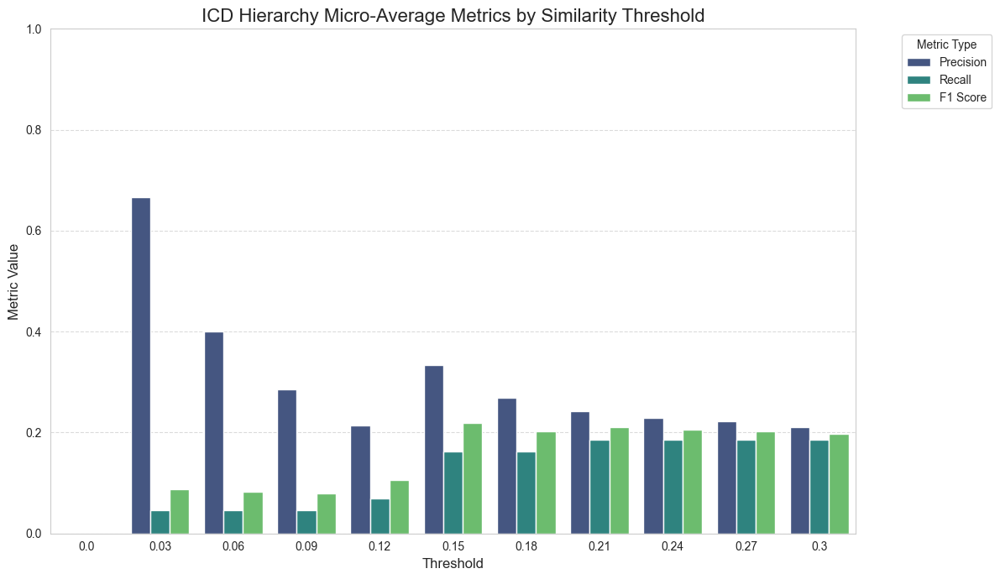

In [31]:
import seaborn as sns
import matplotlib.pyplot as plt

# Set the style of the plot for better aesthetics
sns.set_style("whitegrid")

# Create the grouped bar chart using seaborn
plt.figure(figsize=(12, 7)) # Set the figure size for better readability
sns.barplot(x="Threshold", y="Value", hue="Metric Type", data=df, palette="viridis")

# Add titles and labels for clarity
plt.title("ICD Hierarchy Micro-Average Metrics by Similarity Threshold", fontsize=16)
plt.xlabel("Threshold", fontsize=12)
plt.ylabel("Metric Value", fontsize=12)

# Set the y-axis limit from 0 to 1 as these are metric scores
plt.ylim(0, 1)

# Place the legend outside the plot to avoid overlapping with bars
plt.legend(title="Metric Type", bbox_to_anchor=(1.05, 1), loc='upper left')

# Add a subtle grid on the y-axis for easier value reading
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Adjust layout to prevent labels from being cut off
plt.tight_layout()

# Display the plot
plt.show()

## Plots: evaluation metrics

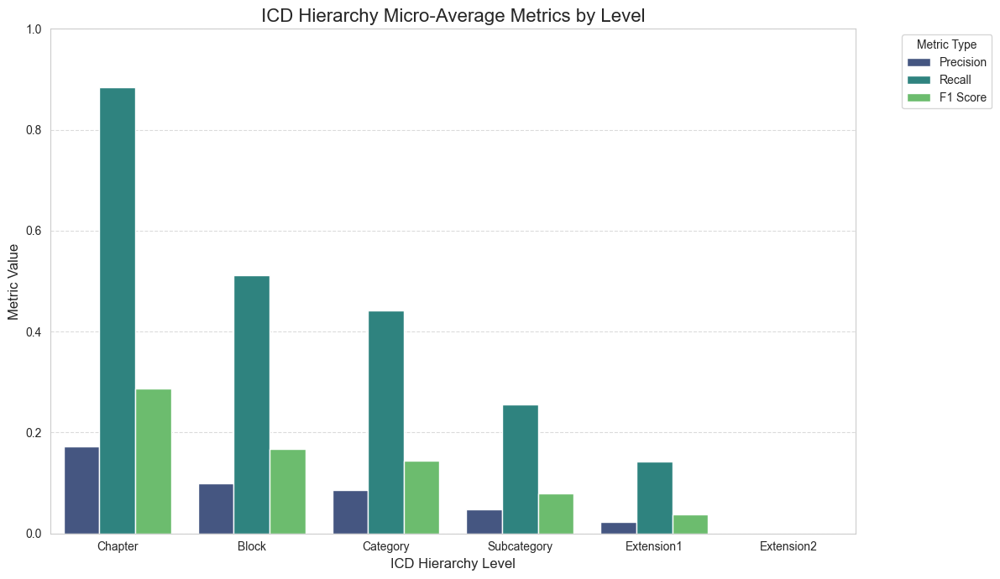

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import json

# Assuming your JSON data is in a file named 'metrics.json'
# Create a dummy metrics.json file for demonstration if you don't have one
# You can save the provided JSON content into a file named 'metrics.json'
json_data_content = """
{
    "some_other_key": {
        "data": "example"
    },
    "icd_hierarchy_micro_average_metrics": {
        "chapter": {
            "precision": 0.172,
            "recall": 0.884,
            "f1_score": 0.288
        },
        "block": {
            "precision": 0.1,
            "recall": 0.512,
            "f1_score": 0.167
        },
        "category": {
            "precision": 0.086,
            "recall": 0.442,
            "f1_score": 0.144
        },
        "subcategory": {
            "precision": 0.047,
            "recall": 0.256,
            "f1_score": 0.08
        },
        "extension1": {
            "precision": 0.022,
            "recall": 0.143,
            "f1_score": 0.038
        },
        "extension2": {
            "precision": 0.0,
            "recall": 0.0,
            "f1_score": 0.0
        }
    }
}
"""

# Save the dummy JSON data to a file
with open('metrics.json', 'w') as f:
    f.write(json_data_content)

# Load the JSON data from the file
try:
    with open('metrics.json', 'r') as f:
        json_data = json.load(f)
except FileNotFoundError:
    print("Error: 'metrics.json' not found. Please ensure the JSON file is in the same directory as the script.")
    exit()

# Extract the relevant micro-average metrics
micro_average_metrics = json_data.get("icd_hierarchy_micro_average_metrics", {})

metrics_data = []

# Iterate through each hierarchy level and its metrics
for level, metrics in micro_average_metrics.items():
    metrics_data.append({
        "Hierarchy Level": level.capitalize(), # Capitalize for cleaner labels
        "Metric Type": "Precision",
        "Value": metrics.get("precision", 0.0)
    })
    metrics_data.append({
        "Hierarchy Level": level.capitalize(),
        "Metric Type": "Recall",
        "Value": metrics.get("recall", 0.0)
    })
    metrics_data.append({
        "Hierarchy Level": level.capitalize(),
        "Metric Type": "F1 Score",
        "Value": metrics.get("f1_score", 0.0)
    })

# Create a Pandas DataFrame from the processed data
df = pd.DataFrame(metrics_data)

# Define the explicit order for the 'Hierarchy Level' to ensure correct plotting order
# Ensure these match the capitalized keys from the JSON
level_order = [
    "Chapter", "Block", "Category", "Subcategory", "Extension1", "Extension2"
]
# Convert 'Hierarchy Level' column to a categorical type with the specified order
df["Hierarchy Level"] = pd.Categorical(df["Hierarchy Level"], categories=level_order, ordered=True)

# Set the style of the plot for better aesthetics
sns.set_style("whitegrid")

# Create the grouped bar chart using seaborn
plt.figure(figsize=(12, 7)) # Set the figure size for better readability
sns.barplot(x="Hierarchy Level", y="Value", hue="Metric Type", data=df, palette="viridis")

# Add titles and labels for clarity
plt.title("ICD Hierarchy Micro-Average Metrics by Level", fontsize=16)
plt.xlabel("ICD Hierarchy Level", fontsize=12)
plt.ylabel("Metric Value", fontsize=12)

# Set the y-axis limit from 0 to 1 as these are metric scores
plt.ylim(0, 1)

# Place the legend outside the plot to avoid overlapping with bars
plt.legend(title="Metric Type", bbox_to_anchor=(1.05, 1), loc='upper left')

# Add a subtle grid on the y-axis for easier value reading
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Adjust layout to prevent labels from being cut off
plt.tight_layout()

# Display the plot
plt.show()

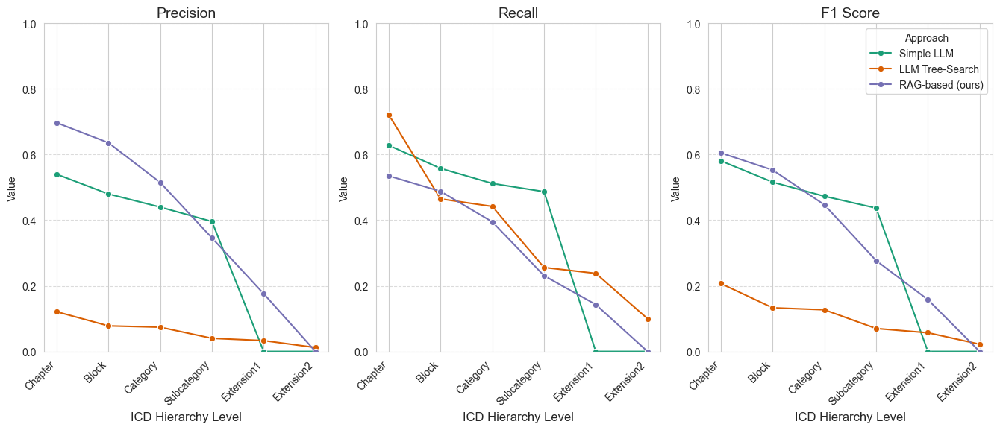

In [11]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import json
import os

# Define the paths to your JSON files and their corresponding approach names
json_files = {
    "Simple LLM": "data/output/experiment_llm_simple/parrot/de/eval_metrics.json",
    "LLM Tree-Search": "data/output/experiment_tree_search/parrot/de/eval_metrics.json",
    "RAG-based (ours)": "data/output/experiment_rag/parrot/de/eval_metrics.json"
}

all_approaches_data_for_df = []

for approach_name, file_path in json_files.items():
    if not os.path.exists(file_path):
        print(f"Error: '{file_path}' not found. Please ensure the JSON file exists.")
        continue

    try:
        with open(file_path, 'r') as f:
            json_data = json.load(f)
    except json.JSONDecodeError:
        print(f"Error: Could not decode JSON from '{file_path}'. Check file format.")
        continue
    except Exception as e:
        print(f"An unexpected error occurred while reading '{file_path}': {e}")
        continue

    # Extract the relevant micro-average metrics for the current approach
    micro_average_metrics = json_data.get("icd_hierarchy_micro_average_metrics", {})

    # Iterate through each hierarchy level and its metrics for this approach
    for level, metrics in micro_average_metrics.items():
        all_approaches_data_for_df.append({
            "Approach": approach_name,
            "Hierarchy Level": level.capitalize(), # Capitalize for cleaner labels
            "Metric Type": "Precision",
            "Value": metrics.get("precision", 0.0)
        })
        all_approaches_data_for_df.append({
            "Approach": approach_name,
            "Metric Type": "Recall",
            "Hierarchy Level": level.capitalize(),
            "Value": metrics.get("recall", 0.0)
        })
        all_approaches_data_for_df.append({
            "Approach": approach_name,
            "Metric Type": "F1 Score",
            "Hierarchy Level": level.capitalize(),
            "Value": metrics.get("f1_score", 0.0)
        })

# Create a Pandas DataFrame from the processed data
df_all = pd.DataFrame(all_approaches_data_for_df)

if df_all.empty:
    print("No data was loaded. Please check your JSON files and paths.")
else:
    # Define the explicit order for the 'Hierarchy Level' to ensure correct plotting order
    level_order = [
        "Chapter", "Block", "Category", "Subcategory", "Extension1", "Extension2"
    ]
    # Convert 'Hierarchy Level' column to a categorical type with the specified order
    df_all["Hierarchy Level"] = pd.Categorical(df_all["Hierarchy Level"], categories=level_order, ordered=True)

    # Set the style of the plot for better aesthetics
    sns.set_style("whitegrid")

    plt.figure(figsize=(15, 6)) # Adjust figure size for three subplots

    # List of metrics to plot
    metric_types = ["Precision", "Recall", "F1 Score"]
    
    # Loop through each metric type to create a separate subplot
    for i, metric_type in enumerate(metric_types):
        plt.subplot(1, 3, i + 1) # (rows, columns, current_plot_number)
        
        # Filter data for the current metric type
        df_metric = df_all[df_all["Metric Type"] == metric_type]
        
        sns.lineplot(
            data=df_metric,
            x="Hierarchy Level",
            y="Value",
            hue="Approach", # Different lines for each approach
            marker='o',      # Add markers for each data point
            palette="Dark2"  # Choose a color palette
        )
        
        plt.title(f"{metric_type}", fontsize=14)
        plt.xlabel("ICD Hierarchy Level", fontsize=12)
        # plt.ylabel(f"{metric_type} Value", fontsize=12)
        plt.ylim(0, 1) # Consistent Y-axis limit for all metric plots
        plt.xticks(rotation=45, ha='right') # Rotate x-axis labels if they overlap
        plt.grid(axis='y', linestyle='--', alpha=0.7) # Add subtle grid
        
        # Place legend outside to avoid overlap, only on the first plot
        if i == 2:
            plt.legend(title="Approach", loc='upper right')
        else:
            plt.legend([],[], frameon=False) # Hide legend on other subplots to avoid redundancy

    # plt.suptitle("Comparison of Evaluation Metrics Across Approaches and Hierarchy Levels", fontsize=16, y=1.05)
    plt.tight_layout(rect=[0, 0, 0.9, 0.98]) # Adjust layout to prevent overlapping titles/legends and make space for suptitle

    plt.show()

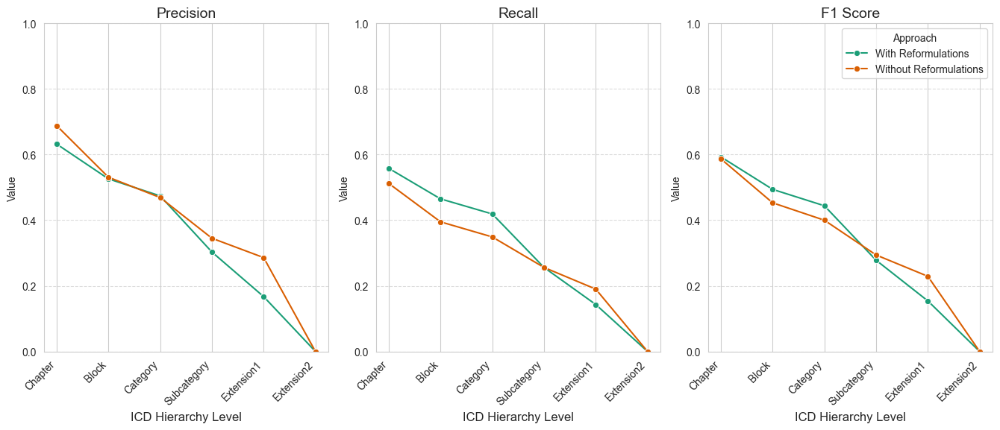

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import json
import os

# Define the paths to your JSON files and their corresponding approach names
json_files = {
    "With Reformulations": "data/output/experiment_rag/parrot/en/eval_metrics.json",
    "Without Reformulations": 'data/output/experiment_rag/parrot/en/no_ref/eval_metrics.json'
}

all_approaches_data_for_df = []

for approach_name, file_path in json_files.items():
    if not os.path.exists(file_path):
        print(f"Error: '{file_path}' not found. Please ensure the JSON file exists.")
        continue

    try:
        with open(file_path, 'r') as f:
            json_data = json.load(f)
    except json.JSONDecodeError:
        print(f"Error: Could not decode JSON from '{file_path}'. Check file format.")
        continue
    except Exception as e:
        print(f"An unexpected error occurred while reading '{file_path}': {e}")
        continue

    # Extract the relevant micro-average metrics for the current approach
    micro_average_metrics = json_data.get("icd_hierarchy_micro_average_metrics", {})

    # Iterate through each hierarchy level and its metrics for this approach
    for level, metrics in micro_average_metrics.items():
        all_approaches_data_for_df.append({
            "Approach": approach_name,
            "Hierarchy Level": level.capitalize(), # Capitalize for cleaner labels
            "Metric Type": "Precision",
            "Value": metrics.get("precision", 0.0)
        })
        all_approaches_data_for_df.append({
            "Approach": approach_name,
            "Metric Type": "Recall",
            "Hierarchy Level": level.capitalize(),
            "Value": metrics.get("recall", 0.0)
        })
        all_approaches_data_for_df.append({
            "Approach": approach_name,
            "Metric Type": "F1 Score",
            "Hierarchy Level": level.capitalize(),
            "Value": metrics.get("f1_score", 0.0)
        })

# Create a Pandas DataFrame from the processed data
df_all = pd.DataFrame(all_approaches_data_for_df)

if df_all.empty:
    print("No data was loaded. Please check your JSON files and paths.")
else:
    # Define the explicit order for the 'Hierarchy Level' to ensure correct plotting order
    level_order = [
        "Chapter", "Block", "Category", "Subcategory", "Extension1", "Extension2"
    ]
    # Convert 'Hierarchy Level' column to a categorical type with the specified order
    df_all["Hierarchy Level"] = pd.Categorical(df_all["Hierarchy Level"], categories=level_order, ordered=True)

    # Set the style of the plot for better aesthetics
    sns.set_style("whitegrid")

    plt.figure(figsize=(15, 6)) # Adjust figure size for three subplots

    # List of metrics to plot
    metric_types = ["Precision", "Recall", "F1 Score"]
    
    # Loop through each metric type to create a separate subplot
    for i, metric_type in enumerate(metric_types):
        plt.subplot(1, 3, i + 1) # (rows, columns, current_plot_number)
        
        # Filter data for the current metric type
        df_metric = df_all[df_all["Metric Type"] == metric_type]
        
        sns.lineplot(
            data=df_metric,
            x="Hierarchy Level",
            y="Value",
            hue="Approach", # Different lines for each approach
            marker='o',      # Add markers for each data point
            palette="Dark2"  # Choose a color palette
        )
        
        plt.title(f"{metric_type}", fontsize=14)
        plt.xlabel("ICD Hierarchy Level", fontsize=12)
        # plt.ylabel(f"{metric_type} Value", fontsize=12)
        plt.ylim(0, 1) # Consistent Y-axis limit for all metric plots
        plt.xticks(rotation=45, ha='right') # Rotate x-axis labels if they overlap
        plt.grid(axis='y', linestyle='--', alpha=0.7) # Add subtle grid
        
        # Place legend outside to avoid overlap, only on the first plot
        if i == 2:
            plt.legend(title="Approach", loc='upper right')
        else:
            plt.legend([],[], frameon=False) # Hide legend on other subplots to avoid redundancy

    # plt.suptitle("Comparison of Evaluation Metrics Across Approaches and Hierarchy Levels", fontsize=16, y=1.05)
    plt.tight_layout(rect=[0, 0, 0.9, 0.98]) # Adjust layout to prevent overlapping titles/legends and make space for suptitle

    plt.show()

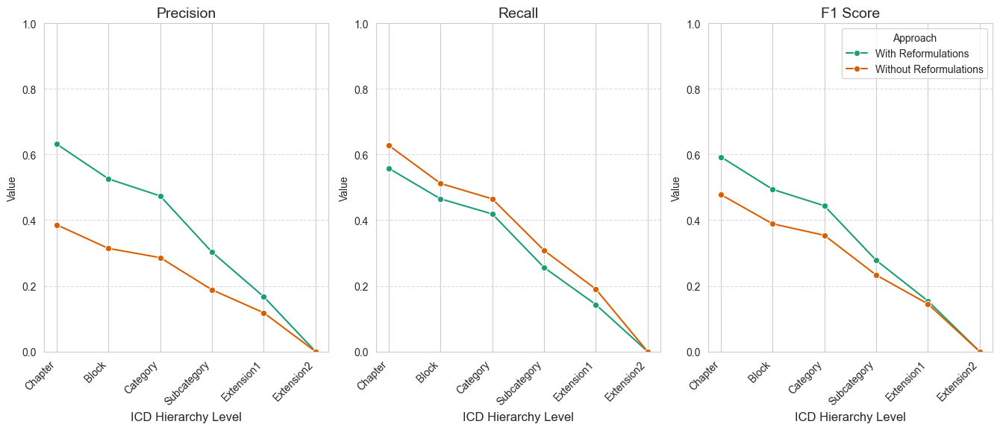

In [2]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import json
import os

# Define the paths to your JSON files and their corresponding approach names
json_files = {
    "With Reformulations": "data/output/experiment_rag/parrot/en/eval_metrics.json",
    "Without Reformulations": 'data/output/experiment_rag/parrot/en/no_thr/eval_metrics.json'
}

all_approaches_data_for_df = []

for approach_name, file_path in json_files.items():
    if not os.path.exists(file_path):
        print(f"Error: '{file_path}' not found. Please ensure the JSON file exists.")
        continue

    try:
        with open(file_path, 'r') as f:
            json_data = json.load(f)
    except json.JSONDecodeError:
        print(f"Error: Could not decode JSON from '{file_path}'. Check file format.")
        continue
    except Exception as e:
        print(f"An unexpected error occurred while reading '{file_path}': {e}")
        continue

    # Extract the relevant micro-average metrics for the current approach
    micro_average_metrics = json_data.get("icd_hierarchy_micro_average_metrics", {})

    # Iterate through each hierarchy level and its metrics for this approach
    for level, metrics in micro_average_metrics.items():
        all_approaches_data_for_df.append({
            "Approach": approach_name,
            "Hierarchy Level": level.capitalize(), # Capitalize for cleaner labels
            "Metric Type": "Precision",
            "Value": metrics.get("precision", 0.0)
        })
        all_approaches_data_for_df.append({
            "Approach": approach_name,
            "Metric Type": "Recall",
            "Hierarchy Level": level.capitalize(),
            "Value": metrics.get("recall", 0.0)
        })
        all_approaches_data_for_df.append({
            "Approach": approach_name,
            "Metric Type": "F1 Score",
            "Hierarchy Level": level.capitalize(),
            "Value": metrics.get("f1_score", 0.0)
        })

# Create a Pandas DataFrame from the processed data
df_all = pd.DataFrame(all_approaches_data_for_df)

if df_all.empty:
    print("No data was loaded. Please check your JSON files and paths.")
else:
    # Define the explicit order for the 'Hierarchy Level' to ensure correct plotting order
    level_order = [
        "Chapter", "Block", "Category", "Subcategory", "Extension1", "Extension2"
    ]
    # Convert 'Hierarchy Level' column to a categorical type with the specified order
    df_all["Hierarchy Level"] = pd.Categorical(df_all["Hierarchy Level"], categories=level_order, ordered=True)

    # Set the style of the plot for better aesthetics
    sns.set_style("whitegrid")

    plt.figure(figsize=(15, 6)) # Adjust figure size for three subplots

    # List of metrics to plot
    metric_types = ["Precision", "Recall", "F1 Score"]
    
    # Loop through each metric type to create a separate subplot
    for i, metric_type in enumerate(metric_types):
        plt.subplot(1, 3, i + 1) # (rows, columns, current_plot_number)
        
        # Filter data for the current metric type
        df_metric = df_all[df_all["Metric Type"] == metric_type]
        
        sns.lineplot(
            data=df_metric,
            x="Hierarchy Level",
            y="Value",
            hue="Approach", # Different lines for each approach
            marker='o',      # Add markers for each data point
            palette="Dark2"  # Choose a color palette
        )
        
        plt.title(f"{metric_type}", fontsize=14)
        plt.xlabel("ICD Hierarchy Level", fontsize=12)
        # plt.ylabel(f"{metric_type} Value", fontsize=12)
        plt.ylim(0, 1) # Consistent Y-axis limit for all metric plots
        plt.xticks(rotation=45, ha='right') # Rotate x-axis labels if they overlap
        plt.grid(axis='y', linestyle='--', alpha=0.7) # Add subtle grid
        
        # Place legend outside to avoid overlap, only on the first plot
        if i == 2:
            plt.legend(title="Approach", loc='upper right')
        else:
            plt.legend([],[], frameon=False) # Hide legend on other subplots to avoid redundancy

    # plt.suptitle("Comparison of Evaluation Metrics Across Approaches and Hierarchy Levels", fontsize=16, y=1.05)
    plt.tight_layout(rect=[0, 0, 0.9, 0.98]) # Adjust layout to prevent overlapping titles/legends and make space for suptitle

    plt.show()

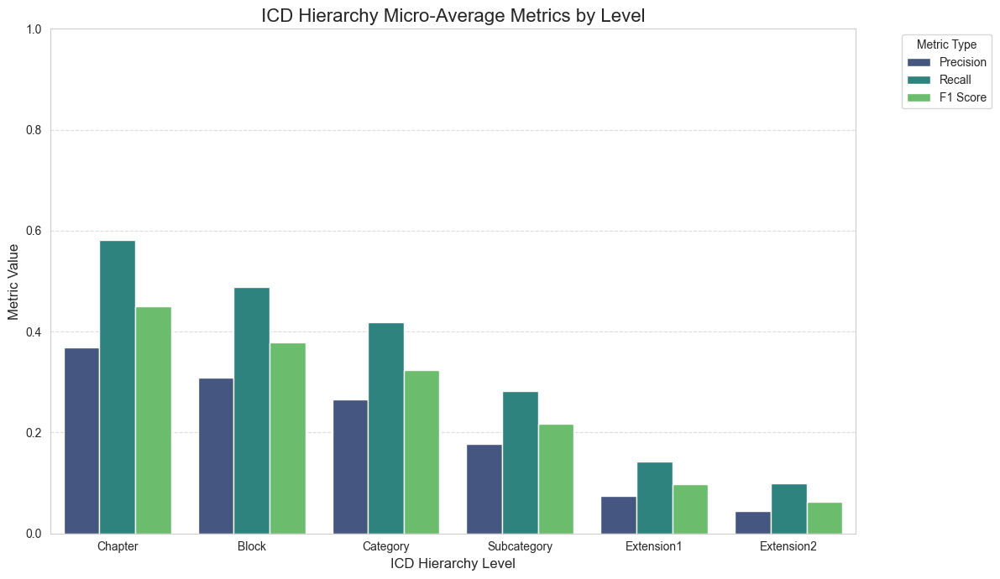

In [3]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Data provided in the original request
data = """
-----------------------------------------------------
ICD HIERARCHY MICRO-AVERAGE METRICS
-----------------------------------------------------
Micro-average Chapter Precision = 0.368
Micro-average Chapter Recall = 0.581
Micro-average Chapter F1 Score = 0.45

Micro-average Block Precision = 0.309
Micro-average Block Recall = 0.488
Micro-average Block F1 Score = 0.378

Micro-average Category Precision = 0.265
Micro-average Category Recall = 0.419
Micro-average Category F1 Score = 0.324

Micro-average Subcategory Precision = 0.177
Micro-average Subcategory Recall = 0.282
Micro-average Subcategory F1 Score = 0.218

Micro-average Extension1 Precision = 0.075
Micro-average Extension1 Recall = 0.143
Micro-average Extension1 F1 Score = 0.098

Micro-average Extension2 Precision = 0.045
Micro-average Extension2 Recall = 0.1
Micro-average Extension2 F1 Score = 0.062
"""

# Process the raw text data into a structured format
lines = data.strip().split('\n')
metrics_data = []

for line in lines:
    line = line.strip()
    # Skip header lines and empty lines
    if not line or '---' in line or 'ICD HIERARCHY' in line:
        continue

    if "Micro-average" in line:
        parts = line.split("Micro-average ")[1].split(" = ")
        metric_full_name = parts[0].strip()
        value = float(parts[1].strip())

        # Determine the hierarchy level and metric type from the full name
        level = None
        metric_type = None

        if "Chapter" in metric_full_name:
            level = "Chapter"
        elif "Block" in metric_full_name:
            level = "Block"
        elif "Category" in metric_full_name:
            level = "Category"
        elif "Subcategory" in metric_full_name:
            level = "Subcategory"
        elif "Extension1" in metric_full_name:
            level = "Extension1"
        elif "Extension2" in metric_full_name:
            level = "Extension2"
        
        if "Precision" in metric_full_name:
            metric_type = "Precision"
        elif "Recall" in metric_full_name:
            metric_type = "Recall"
        elif "F1 Score" in metric_full_name:
            metric_type = "F1 Score"
        
        # If both level and metric type are identified, add to the list
        if level and metric_type:
            metrics_data.append({
                "Hierarchy Level": level,
                "Metric Type": metric_type,
                "Value": value
            })

# Create a Pandas DataFrame from the processed data
df = pd.DataFrame(metrics_data)

# Define the explicit order for the 'Hierarchy Level' to ensure correct plotting order
level_order = [
    "Chapter", "Block", "Category", "Subcategory", "Extension1", "Extension2"
]
# Convert 'Hierarchy Level' column to a categorical type with the specified order
df["Hierarchy Level"] = pd.Categorical(df["Hierarchy Level"], categories=level_order, ordered=True)

# Set the style of the plot for better aesthetics
sns.set_style("whitegrid")

# Create the grouped bar chart using seaborn
plt.figure(figsize=(12, 7)) # Set the figure size for better readability
sns.barplot(x="Hierarchy Level", y="Value", hue="Metric Type", data=df, palette="viridis")

# Add titles and labels for clarity
plt.title("ICD Hierarchy Micro-Average Metrics by Level", fontsize=16)
plt.xlabel("ICD Hierarchy Level", fontsize=12)
plt.ylabel("Metric Value", fontsize=12)

# Set the y-axis limit from 0 to 1 as these are metric scores
plt.ylim(0, 1)

# Place the legend outside the plot to avoid overlapping with bars
plt.legend(title="Metric Type", bbox_to_anchor=(1.05, 1), loc='upper left')

# Add a subtle grid on the y-axis for easier value reading
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Adjust layout to prevent labels from being cut off
plt.tight_layout()

# Display the plot
plt.show()

### LLM thresholding activated

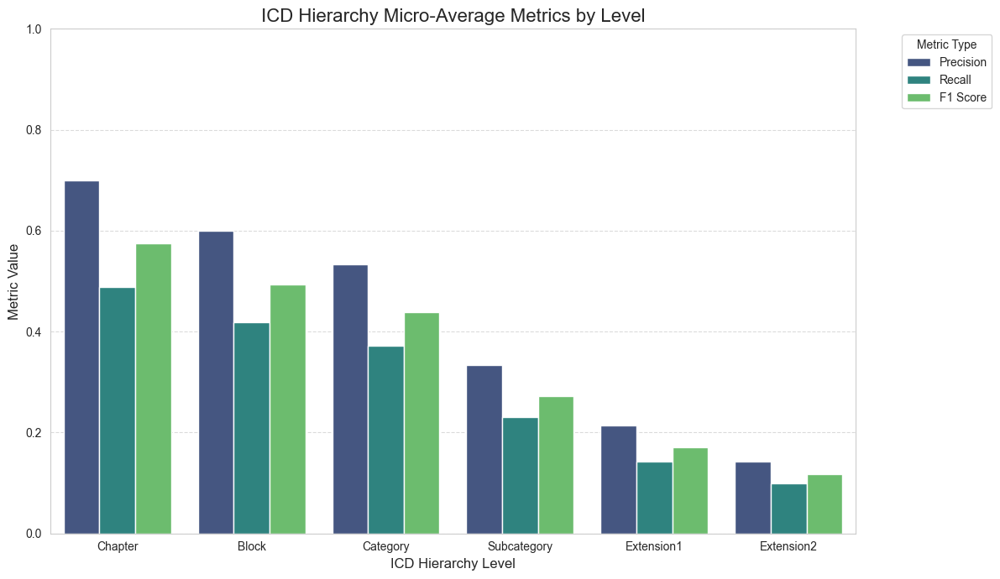

In [2]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Data provided in the original request
data = """
ICD HIERARCHY MICRO-AVERAGE METRICS
-----------------------------------------------------
Micro-average Chapter Precision = 0.7
Micro-average Chapter Recall = 0.488
Micro-average Chapter F1 Score = 0.575

Micro-average Block Precision = 0.6
Micro-average Block Recall = 0.419
Micro-average Block F1 Score = 0.493

Micro-average Category Precision = 0.533
Micro-average Category Recall = 0.372
Micro-average Category F1 Score = 0.438

Micro-average Subcategory Precision = 0.333
Micro-average Subcategory Recall = 0.231
Micro-average Subcategory F1 Score = 0.273

Micro-average Extension1 Precision = 0.214
Micro-average Extension1 Recall = 0.143
Micro-average Extension1 F1 Score = 0.171

Micro-average Extension2 Precision = 0.143
Micro-average Extension2 Recall = 0.1
Micro-average Extension2 F1 Score = 0.118
"""

# Process the raw text data into a structured format
lines = data.strip().split('\n')
metrics_data = []

for line in lines:
    line = line.strip()
    # Skip header lines and empty lines
    if not line or '---' in line or 'ICD HIERARCHY' in line:
        continue

    if "Micro-average" in line:
        parts = line.split("Micro-average ")[1].split(" = ")
        metric_full_name = parts[0].strip()
        value = float(parts[1].strip())

        # Determine the hierarchy level and metric type from the full name
        level = None
        metric_type = None

        if "Chapter" in metric_full_name:
            level = "Chapter"
        elif "Block" in metric_full_name:
            level = "Block"
        elif "Category" in metric_full_name:
            level = "Category"
        elif "Subcategory" in metric_full_name:
            level = "Subcategory"
        elif "Extension1" in metric_full_name:
            level = "Extension1"
        elif "Extension2" in metric_full_name:
            level = "Extension2"
        
        if "Precision" in metric_full_name:
            metric_type = "Precision"
        elif "Recall" in metric_full_name:
            metric_type = "Recall"
        elif "F1 Score" in metric_full_name:
            metric_type = "F1 Score"
        
        # If both level and metric type are identified, add to the list
        if level and metric_type:
            metrics_data.append({
                "Hierarchy Level": level,
                "Metric Type": metric_type,
                "Value": value
            })

# Create a Pandas DataFrame from the processed data
df = pd.DataFrame(metrics_data)

# Define the explicit order for the 'Hierarchy Level' to ensure correct plotting order
level_order = [
    "Chapter", "Block", "Category", "Subcategory", "Extension1", "Extension2"
]
# Convert 'Hierarchy Level' column to a categorical type with the specified order
df["Hierarchy Level"] = pd.Categorical(df["Hierarchy Level"], categories=level_order, ordered=True)

# Set the style of the plot for better aesthetics
sns.set_style("whitegrid")

# Create the grouped bar chart using seaborn
plt.figure(figsize=(12, 7)) # Set the figure size for better readability
sns.barplot(x="Hierarchy Level", y="Value", hue="Metric Type", data=df, palette="viridis")

# Add titles and labels for clarity
plt.title("ICD Hierarchy Micro-Average Metrics by Level", fontsize=16)
plt.xlabel("ICD Hierarchy Level", fontsize=12)
plt.ylabel("Metric Value", fontsize=12)

# Set the y-axis limit from 0 to 1 as these are metric scores
plt.ylim(0, 1)

# Place the legend outside the plot to avoid overlapping with bars
plt.legend(title="Metric Type", bbox_to_anchor=(1.05, 1), loc='upper left')

# Add a subtle grid on the y-axis for easier value reading
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Adjust layout to prevent labels from being cut off
plt.tight_layout()

# Display the plot
plt.show()

## Plot: frequency of ICD codes in our data

In [20]:
with open('../PARROT_sample_reports/german_reports.json', "r", encoding="utf-8") as f:
    reports = json.load(f)

In [21]:
with open('all_codes.tsv', "w") as f:
    for entry in reports:
        report_no = entry["no"]
        icd_codes = [code.strip() for code in entry["icd"].split(',')]
        
        for code in icd_codes:
            f.write(f"{report_no}\t{code}\n")

In [22]:
df_gs = pd.read_csv("all_codes.tsv", sep="\t")
df_gs.columns = ['clinical_case', "code"]
df_gs

,clinical_case,code
0,182,K92.2
1,183,I63.311
2,183,R47.01
3,183,R29.898
4,184,B25.9
...,...,...
807,2235,I65.21
808,2235,K57.32
809,2235,E04.1
810,2235,Z96.641


In [24]:
code_counts = df_gs['code'].value_counts().reset_index()
code_counts.columns = ['code', 'count']
code_counts

,code,count
0,Z00,39
1,J90,22
2,R91.8,16
3,J18.9,12
4,N28.1,11
...,...,...
407,V99,1
408,Z04.1,1
409,S22.42,1
410,A18.1,1


In [ ]:
import plotly.express as px

#  Add index to use as x-axis (just integers)
code_counts['index'] = code_counts.index

# Plot
fig = px.bar(
    code_counts,
    x='index',  # use a simple index to avoid clutter
    y='count',
    hover_data={'code': True, 'index': False},  # show code on hover
    labels={'index': 'Code'},  # rename axis
    title='Code Frequency Plot'
)

# Hide x-axis tick labels
fig.update_layout(
    xaxis=dict(
        tickvals=[]  # hide tick labels
    )
)

fig.show()

In [ ]:
os.remove("all_codes.tsv")

## Preparing CodiEsp Dataset

In [24]:
import pandas as pd
import simple_icd_10_cm as cm 
df = pd.read_csv('/Users/caterinagalata/Documents/TUM/Master/TUM-DI-LAB/radiology-app/test/automated-clinical-coding-llm/final_dataset_v4_to_publish/test/testD.tsv', sep='\t', header=None)
df[1] = df[1].apply(str.upper)
df['mask'] = df[1].apply(cm.is_valid_item)
df = df[df['mask']]
df[1] = df[1].apply(cm.remove_dot)
df[1] = df[1].apply(str.lower)
df = df.drop(['mask'], axis=1)
df.to_csv('/Users/caterinagalata/Documents/TUM/Master/TUM-DI-LAB/radiology-app/test/icd_coding/data/codiesp_ground_truth_labels.tsv', sep='\t', header=False)

In [1]:
import os
import json
import pandas as pd 

# --- Configuration ---
ENG_REPORTS_FOLDER = '/Users/caterinagalata/Documents/TUM/Master/TUM-DI-LAB/radiology-app/test/automated-clinical-coding-llm/final_dataset_v4_to_publish/test/text_files_en'
REPORTS_FOLDER = '/Users/caterinagalata/Documents/TUM/Master/TUM-DI-LAB/radiology-app/test/automated-clinical-coding-llm/final_dataset_v4_to_publish/test/text_files'
LABELS_TSV_FILE = '/Users/caterinagalata/Documents/TUM/Master/TUM-DI-LAB/radiology-app/test/automated-clinical-coding-llm/final_dataset_v4_to_publish/test/testD.tsv'
OUTPUT_JSON_FILE = '../codiesp_reports.json'

# --- Placeholder for translation (replace with actual API call if needed) ---
# For demonstration, a simple mock translation. In a real app, you'd use an API.
# You could also use a library like 'google_trans_new' or 'deep_translator'
# but be mindful of API limits and costs.
def get_translation(german_text: str) -> str:
    """Mocks a translation service for demonstration purposes."""
    if "Pankreatitis" in german_text:
        return "Clinical Information, Question, Justification for Procedure: Pancreatitis. Active perigastric bleeding. Hemostasis requested. ..."
    elif "Armparese rechts" in german_text:
        return "Clinical Information, Question, Justification: Right arm paresis, aphasia, slowness, unclear time window. M1 occlusion on the left. Recanalization requested. ..."
    else:
        return "Translation placeholder for: " + german_text[:50] + "..."


# --- Main Script ---
def generate_medical_reports_json(eng_reports_folder, reports_folder, labels_tsv_file, output_json_file):
    all_reports_data = []

    # 1. Load Labels from TSV
    # Using pandas is robust for TSV, handles multiple entries per report ID
    labels_df = pd.read_csv(labels_tsv_file, sep='\t', header=None, names=['report_id', 'icd_code'])
    labels_df['icd_code'] = labels_df['icd_code'].apply(str.upper)

    # Group ICD codes by report_id
    icd_codes_map = labels_df.groupby('report_id')['icd_code'].apply(lambda x: ', '.join(x)).to_dict()
    print(f"Loaded ICD codes for {len(icd_codes_map)} reports.")

    # 2. Process each report file
    report_files = [f for f in os.listdir(reports_folder) if f.endswith('.txt')]
    report_files.sort() # Ensure consistent order
    eng_report_files = [f for f in os.listdir(eng_reports_folder) if f.endswith('.txt')]
    eng_report_files.sort() # Ensure consistent order

    for i, filename in enumerate(report_files):
        file_path = os.path.join(reports_folder, filename)
        eng_file_path = os.path.join(eng_reports_folder, filename)
        report_id = os.path.splitext(filename)[0] # e.g., 'report_182'

        report_no = i

        with open(file_path, 'r', encoding='utf-8') as f:
            report_content = f.read()
        with open(eng_file_path, 'r', encoding='utf-8') as f:
            eng_report_content = f.read()

        # Get ICD codes for the current report ID
        icd_codes = icd_codes_map.get(report_id, '')

        # Populate the dictionary for the current report
        report_entry = {
            "no": report_no,
            "language": "Spanish",  # Assuming all are German
            "report": report_content,
            "translation": eng_report_content,
            "icd": icd_codes,
        }
        all_reports_data.append(report_entry)

    # 3. Write to JSON file
    with open(output_json_file, 'w', encoding='utf-8') as f:
        json.dump(all_reports_data, f, ensure_ascii=False, indent=2)

    print(f"\nSuccessfully generated {len(all_reports_data)} entries to {output_json_file}")

# Run the generation
generate_medical_reports_json(ENG_REPORTS_FOLDER, REPORTS_FOLDER, LABELS_TSV_FILE, OUTPUT_JSON_FILE)

# --- Verify the output ---
with open(OUTPUT_JSON_FILE, 'r', encoding='utf-8') as f:
    generated_json = json.load(f)
    print("\n--- Sample of generated JSON (first entry) ---")
    print(json.dumps(generated_json[0], indent=2, ensure_ascii=False))

Loaded ICD codes for 250 reports.

Successfully generated 250 entries to ../codiesp_reports.json

--- Sample of generated JSON (first entry) ---
{
  "no": 0,
  "language": "Spanish",
  "report": "Paciente de 70 años de edad, minero jubilado, sin alergias medicamentosas conocidas, que presenta como antecedentes personales: accidente laboral antiguo con fracturas vertebrales y costales; intervenido de enfermedad de Dupuytren en mano derecha y by-pass iliofemoral izquierdo; Diabetes Mellitus tipo II, hipercolesterolemia e hiperuricemia; enolismo activo, fumador de 20 cigarrillos / día.\nEs derivado desde Atención Primaria por presentar hematuria macroscópica postmiccional en una ocasión y microhematuria persistente posteriormente, con micciones normales.\nEn la exploración física presenta un buen estado general, con abdomen y genitales normales; tacto rectal compatible con adenoma de próstata grado I/IV.\nEn la analítica de orina destaca la existencia de 4 hematíes/ campo y 0-5 leucocitos